<a href="https://colab.research.google.com/github/yaxin06/plot_plate_boundary_pygmt/blob/main/pygmt_plot_plate_boundary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PyGMT 0.17 no Google Colab

> ⚠️ **Nota:** Há uma incompatibilidade temporária no sistema de resolução do conda/mamba no Colab (a versão do Python em uso é **3.12.11**, mas o solver pode conter um *pin* interno diferente).  
> Por isso, para instalar o PyGMT é necessário usar uma versão compatível do **condacolab** (ou ajustar o arquivo `pinned` do conda para **python=3.12**).  
> Depois disso, o **PyGMT 0.17** instala e executa normalmente. Isso será corrigido em uma atualização futura do Colab.


In [1]:
!pip install condacolab --quiet
# need to install condacolab for a python 3.11 pin
import condacolab
condacolab.install_from_url("https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh")

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:11
🔁 Restarting kernel...


**Don't PANIC !** The kernel will restart automatically.

After that, install `pygmt` normally.

In [1]:
!mamba install pygmt --quiet # <--- it takes around 1 minute

warning  libmamba [numpy-2.3.5-py312h33ff503_0] The following files were already present in the environment:
    - bin/f2py
    - bin/numpy-config


In [2]:
!mamba install obspy --quiet

warning  libmamba [fonttools-4.60.1-py312h8a5da7c_0] The following files were already present in the environment:
    - bin/fonttools
    - bin/pyftmerge
    - bin/pyftsubset
    - bin/ttx
    - share/man/man1/ttx.1


In [3]:
import pygmt
pygmt.show_versions()

PyGMT information:
  version: v0.17.0
System information:
  python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
  executable: /usr/bin/python3.real
  machine: Linux-6.6.105+-x86_64-with-glibc2.35
Dependency information:
  numpy: 2.3.5
  pandas: 2.2.2
  xarray: 2025.11.0
  packaging: 25.0
  contextily: None
  geopandas: 1.1.1
  IPython: 7.34.0
  pyarrow: 18.1.0
  rioxarray: None
  gdal: 3.11.0
  ghostscript: 10.06.0
GMT library information:
  version: 6.5.0
  padding: 2
  share dir: /usr/local/share/gmt
  plugin dir: /usr/local/lib/gmt/plugins
  library path: /usr/local/lib/libgmt.so
  cores: 2
  grid layout: rows
  image layout: 
  binary version: 6.5.0


gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 1x1 arc degrees reduced by Gaussian Cartesian filtering (314.5 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [111K]: earth_relief_01d_p.grd


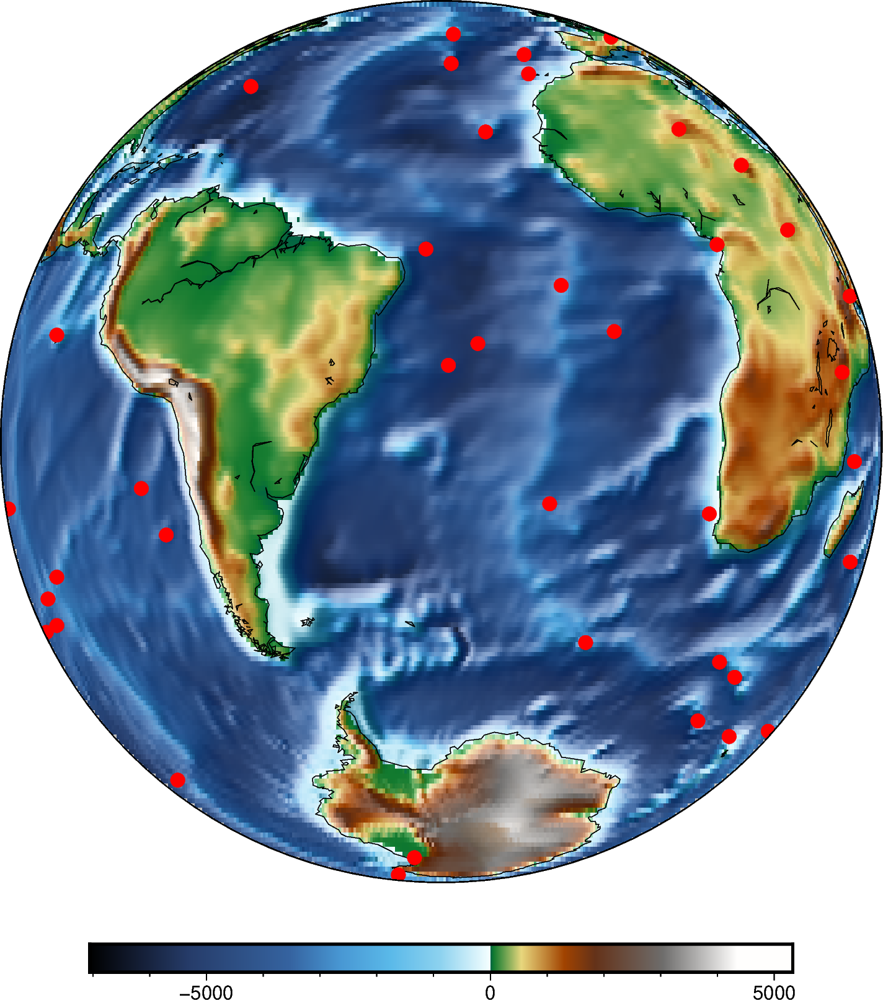

In [4]:
# Just an example
from pygmt.datasets import load_earth_relief #<-- Use global relief for topography

grid = load_earth_relief(resolution='01d', registration='pixel')

fig = pygmt.Figure()
fig.basemap(region='g', projection='G330/-30/12c', frame=True)
fig.grdimage(grid, cmap='geo', shading=True)
fig.coast(resolution='c', shorelines=True, area_thresh=1000)
fig.plot(data='@hotspots.txt', style='c0.2c', fill='red')
fig.colorbar()
fig.show()

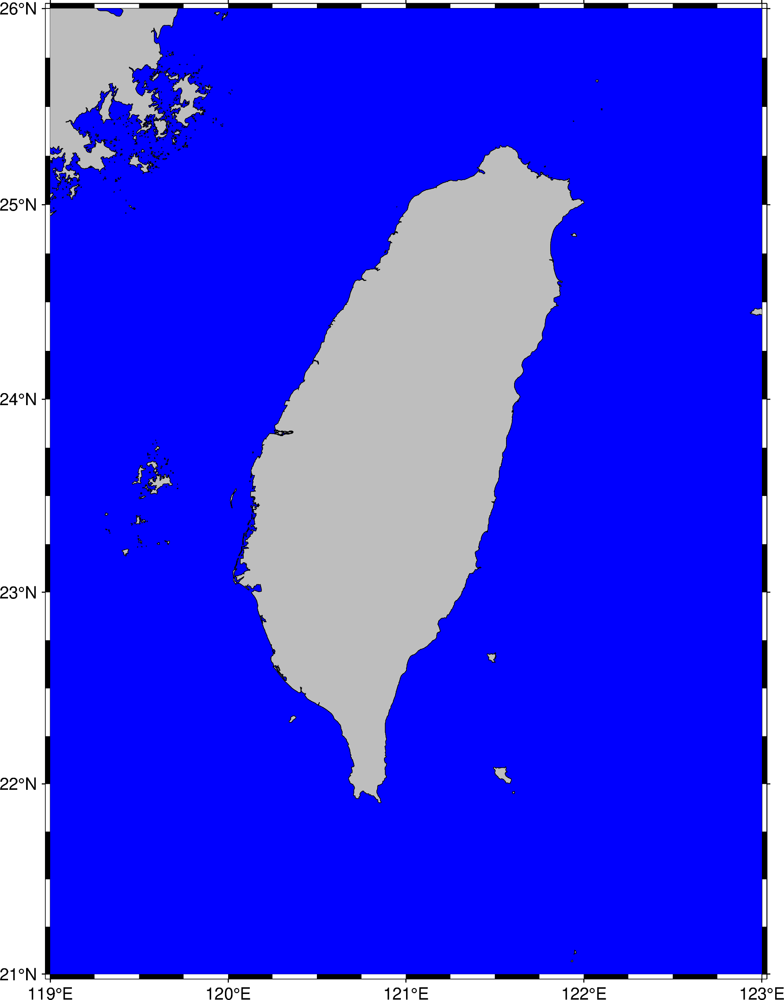

In [5]:
fig = pygmt.Figure()
fig.basemap(region="119/123/21/26", projection="M15c", frame=True)
fig.coast(shorelines=True, land="gray", water="blue", resolution="full")
fig.show()

grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief v2.7 at 05x05 arc minutes reduced by Gaussian Cartesian filtering (26.2 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 180x180 degree grid tile (earth_relief_05m_p): S90E000


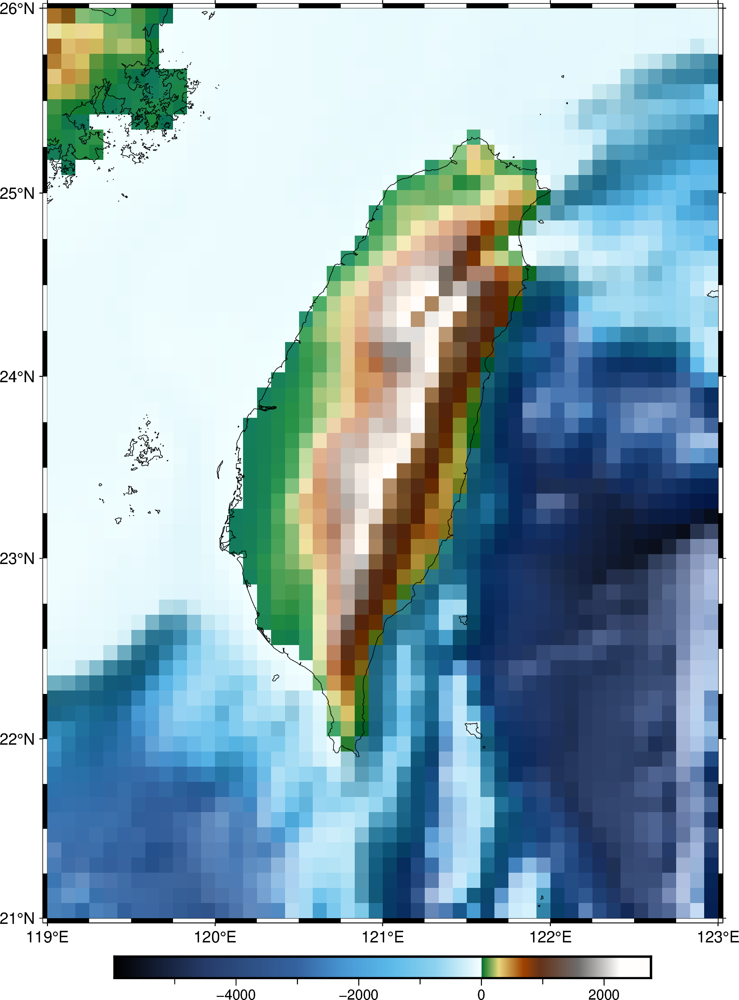

In [6]:
# Plot Taiwan with Earth relief data
from pygmt.datasets import load_earth_relief

# Load earth relief data for the region of Taiwan
# The 'region' parameter in basemap will effectively crop this global grid
grid = load_earth_relief(resolution='05m', region="119/123/21/26", registration='pixel')

fig = pygmt.Figure()
# Set region for Taiwan (longitude: 119-123, latitude: 21-26)
# Use Mercator projection ('M') for a regional view
fig.basemap(region="119/123/21/26", projection="M15c", frame=True)
fig.grdimage(grid, cmap='geo', shading=True)
# Use 'h' (high) resolution for better detail for Taiwan's coastlines
fig.coast(resolution='h', shorelines=True)
# Remove the global hotspots plot, as it's not specific to Taiwan in this context
# fig.plot(data='@hotspots.txt', style='c0.2c', fill='red') # Uncomment if you want to include global hotspots
fig.colorbar()
fig.show()

grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief v2.7 at 02x02 arc minutes reduced by Gaussian Cartesian filtering (10.5 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 60x60 degree grid tile (earth_relief_02m_p): S90W060


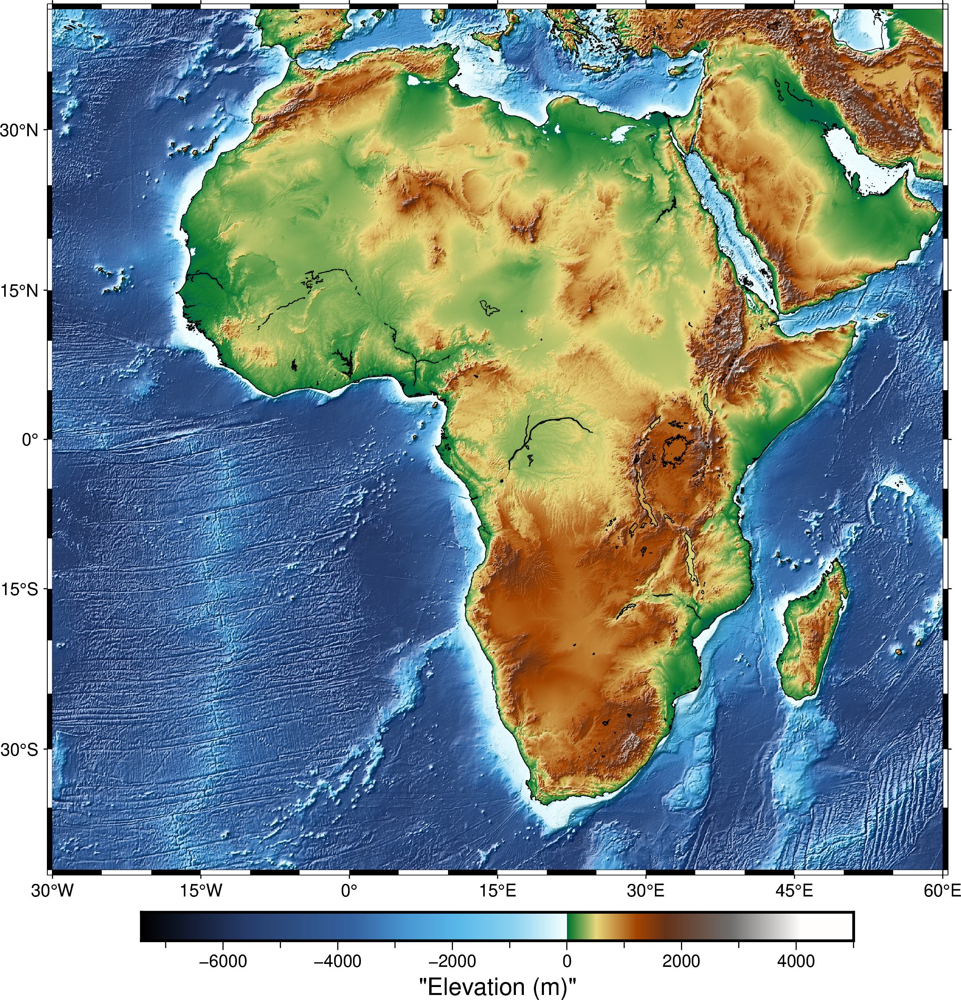

In [7]:
import pygmt
from pygmt.datasets import load_earth_relief

# 載入「非洲板塊」附近的地形資料
# region="西經/東經/南緯/北緯"
# 這裡大致涵蓋整個非洲大陸以及周邊板塊區域
grid = load_earth_relief(
    resolution="02m",              # 比 05m 更高解析度（2 arc-min）
    region="-30/60/-40/40",        # 非洲（含附近海域）的大區域
    registration="pixel"
)

fig = pygmt.Figure()

# 繪圖區域：同樣使用 Mercator 投影
fig.basemap(
    region="-30/60/-40/40",        # 非洲板塊區域
    projection="M18c",             # 地圖寬度 18 cm，可以自己調
    frame=True                     # 自動給邊框與座標軸
)

# 畫出地形陰影圖
fig.grdimage(
    grid=grid,
    cmap="geo",                    # 地形配色
    shading=True
)

# 海岸線：用最高解析度 f（full resolution）
fig.coast(
    resolution="f",                # c:粗 l:低 i:中 h:高 f:最高
    shorelines=True                # 顯示海岸線
)

# 色階條
fig.colorbar(frame='af+l"Elevation (m)"')

fig.show()


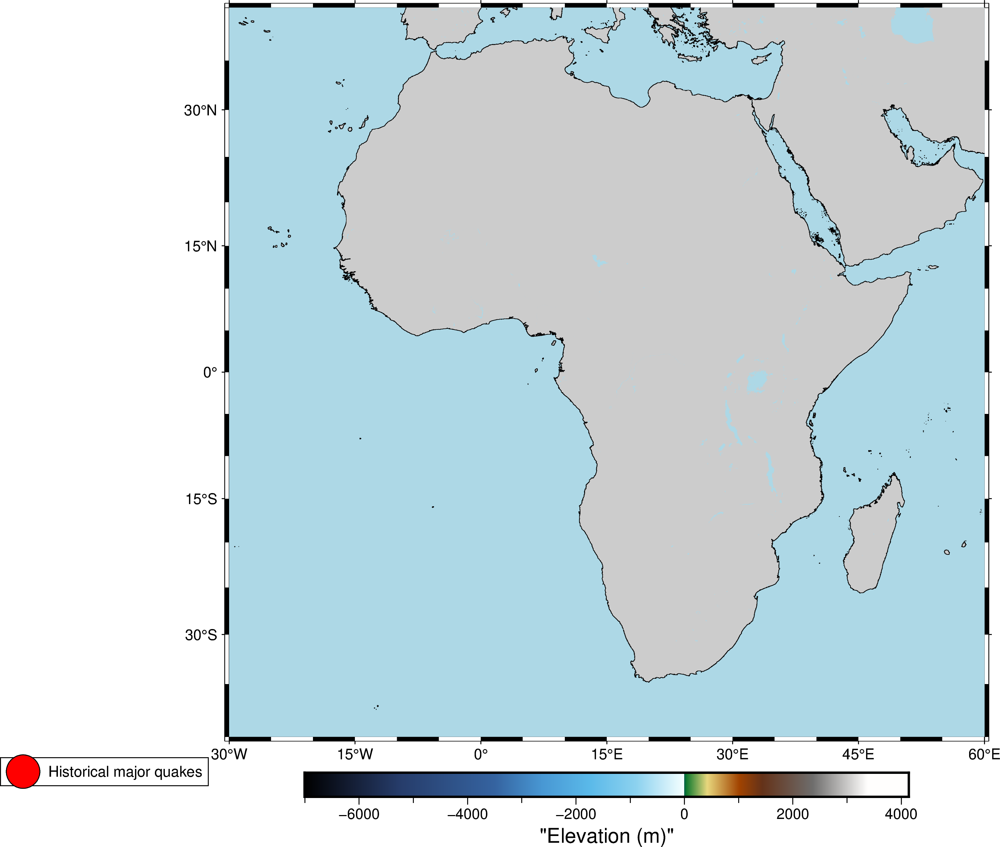

In [17]:
import pygmt
from pygmt.datasets import load_earth_relief  # 只需要這個就好

# 1. 設定「非洲板塊」的大致範圍：經度 -30~60、緯度 -40~40
region = [-30, 60, -40, 40]

# 2. 載入該區域的地形資料（解析度比 01d 高）
grid = load_earth_relief(
    resolution="05m",        # 5 arc-min，比 01d 更細
    region=region,
    registration="pixel"
)

# 3. 建立圖形
fig = pygmt.Figure()

# 底圖：Mercator 投影，地圖寬 18 cm
fig.basemap(
    region=region,
    projection="M18c",
    frame=["WSne", "af"]      # 邊框＋刻度
)

# 4. 畫地形底圖
fig.grdimage(
    grid=grid,
    cmap="geo",
    shading=True
)

# 5. 海岸線與陸海顏色
fig.coast(
    shorelines="1/0.3p,black",  # 海岸線
    resolution="f",              # full：最高解析度
    land="gray80",
    water="lightblue"
)

# 6. 火山：GMT 遠端檔 @volcanoes.txt
# fig.plot(
#     data="@volcanoes.txt",
#     style="t0.25c",           # t = triangle
#     fill="red",
#     pen="0.25p,black",
#     label="Volcanoes"
# )

# 7. 歷史上著名地震：GMT 教學檔 @tut_quakes.ngdc
#    這個檔裡是全球重大地震事件，會自動依 region 裁切
fig.plot(
    data="@tut_quakes.ngdc",
    style="c0.8c",           # 將符號改為圓形 (c) 並將顏色改為紅色 (fill="red")
    fill="red",
    pen="0.5p,black",
    label="Historical major quakes"
)

# 如果你想再額外畫「一般地震分布」，就需要自己準備地震資料檔（CSV/TXT）再用 fig.plot 讀

# 8. 色階條（地形高度）
fig.colorbar(frame='af+l"Elevation (m)"')

# 9. 圖例
fig.legend(
    position="JBL+o0.5c/0.5c",
    box="+gwhite+p0.5p"
)

fig.show()


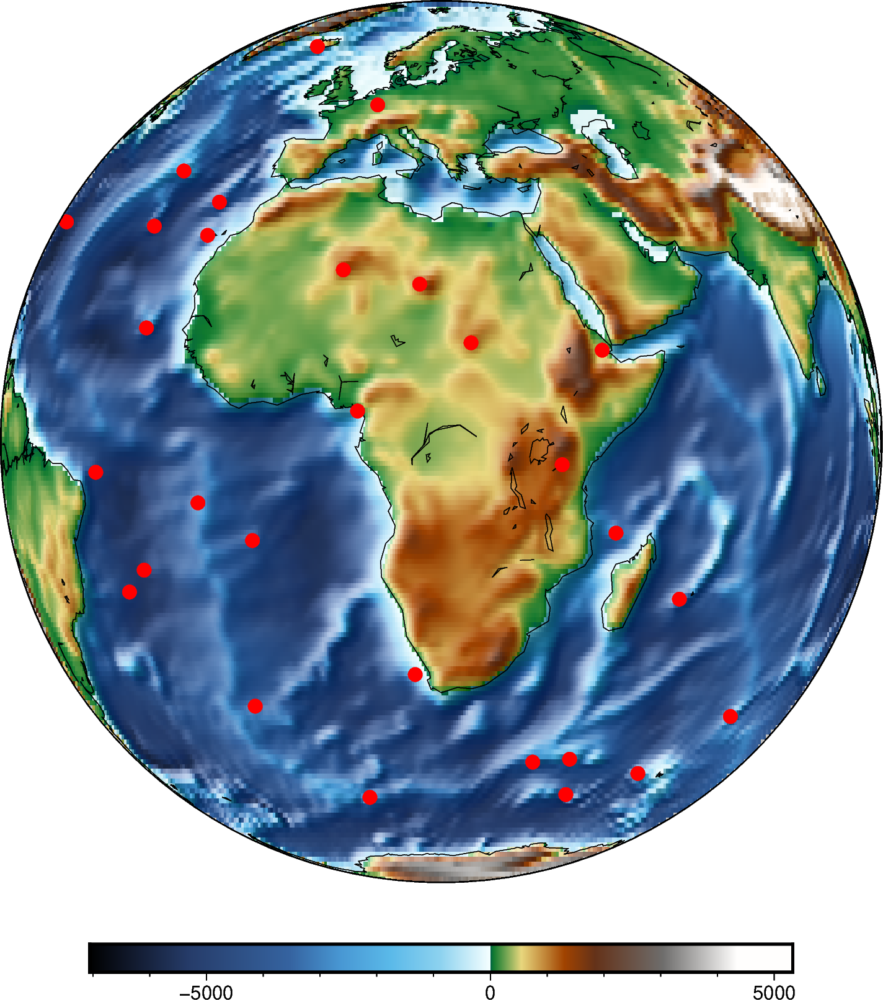

In [19]:
# Africa plate example based on the given template
import pygmt
from pygmt.datasets import load_earth_relief  # <-- Use global relief for topography

# 載入全球地形（跟你給的範例一樣用 01d）
grid = load_earth_relief(resolution="01d", registration="pixel")

fig = pygmt.Figure()

# 底圖：以「非洲上空」為中心的球面投影
# G經度/緯度/寬度，這裡選 20E, 0N，大約在非洲中部上空
fig.basemap(region="g", projection="G20/0/12c", frame=True)

# 地形底圖
fig.grdimage(grid, cmap="geo", shading=True)

# 海岸線（跟你原本範例一樣）
fig.coast(resolution="c", shorelines=True, area_thresh=1000)

# 熱點（可視為火山/板塊活動熱點）
fig.plot(data="@hotspots.txt", style="c0.2c", fill="red")

# 色階條
fig.colorbar()

fig.show()
